 Importing  libraries

In [1]:
# Importing required libraries
# the code is same as previous one
# here it will be little more complex as we work on multichannel images which are more complex than grayscale images
import os
import time
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

from tqdm import tqdm
from tensorflow.keras import layers

In [2]:
# to get current working directory
os.getcwd()

'/content'

Mounting Google drive into Colab so as to use the Image data from the Drive

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
# Unzip the file and store that in content folder for ease of access
!unzip '/content/drive/MyDrive/anime_images_data.zip' -d'/content'

Streaming output truncated to the last 5000 lines.
  inflating: /content/Ex_Files_GANs_and_Diffusion_Models_in_ML/Exercise Files/images/24448_2009.jpg  
  inflating: /content/Ex_Files_GANs_and_Diffusion_Models_in_ML/Exercise Files/images/37293_2012.jpg  
  inflating: /content/Ex_Files_GANs_and_Diffusion_Models_in_ML/Exercise Files/images/55418_2016.jpg  
  inflating: /content/Ex_Files_GANs_and_Diffusion_Models_in_ML/Exercise Files/images/11384_2005.jpg  
  inflating: /content/Ex_Files_GANs_and_Diffusion_Models_in_ML/Exercise Files/images/56083_2017.jpg  
  inflating: /content/Ex_Files_GANs_and_Diffusion_Models_in_ML/Exercise Files/images/22105_2008.jpg  
  inflating: /content/Ex_Files_GANs_and_Diffusion_Models_in_ML/Exercise Files/images/28027_2009.jpg  
  inflating: /content/Ex_Files_GANs_and_Diffusion_Models_in_ML/Exercise Files/images/34688_2011.jpg  
  inflating: /content/Ex_Files_GANs_and_Diffusion_Models_in_ML/Exercise Files/images/51707_2015.jpg  
  inflating: /content/Ex_Files_

This data comprises of anime images, each image contains the face of an anime character

In [5]:
# check out the director for files
!ls /content

drive  Ex_Files_GANs_and_Diffusion_Models_in_ML  sample_data


TODO: Recording - please show the location where you have added these images in drive

We need to upload the anime_images folder into Mydrive of Google Drive.
We are loading Anime faces dataset from Google Drive.
Also, normalizing the images to [-1, 1]because the generator’s final layer activation uses tanh

In [6]:
# Here we are using the batch size of 128 for training DCGAN
batch_size = 128

# Setting up the dataset object which will allow us to load our training data in batches
# Here we are using the image from directory for loadding content from folder
# our training data doesnot have labels as GAN is a unsupervised learning
train_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    '/content/Ex_Files_GANs_and_Diffusion_Models_in_ML/Exercise Files/images',
    label_mode = None,
    # the image size is 64 x 64, so the height and width of every image in the dataset is 64 x 64 pixels
    image_size = (64, 64), batch_size = batch_size
)
'''
- every image in this training data is a color image or multi-channel image
- which means there are 3 values that used to represent every pixel in each image
- These three values represent the RGB values of the pixel and each RGB value is an integer between 0 and 255
- now we will scale all of the image pixel values so that they are expressed in the range of -1 to 1
- we will divide every value by 127.5 then subtract 1
'''
train_dataset = train_dataset.map(lambda x: (x / 127.5) - 1)

# here we can see that we have around 63,500 files in our training data

Found 63565 files belonging to 1 classes.


Visualising a batch of real image data

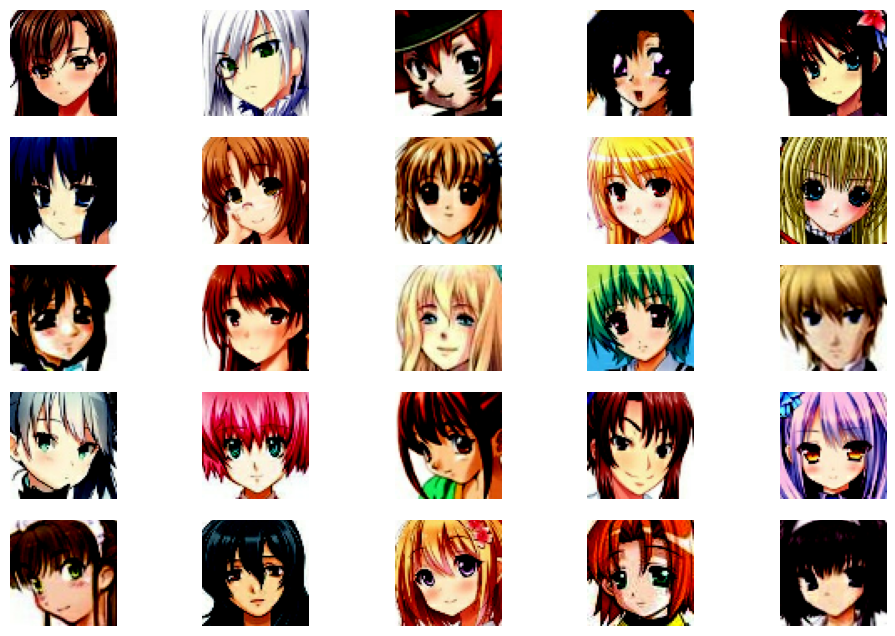

In [7]:
# here we will look at the training data
plt.figure(figsize = (12, 8))

# This code here extracts 1st 25 images from the 1st batch in out training dataset
for images in train_dataset.take(1):
    for i in range(25):
        ax = plt.subplot(5, 5, i + 1)
        plt.imshow(images[i].numpy())
        plt.axis('off')

Retrieving and plotting  a sample image from batch data and checking its shape. Note that as images are colored, third dimension(channel) is 3

Image_shape (64, 64, 3)


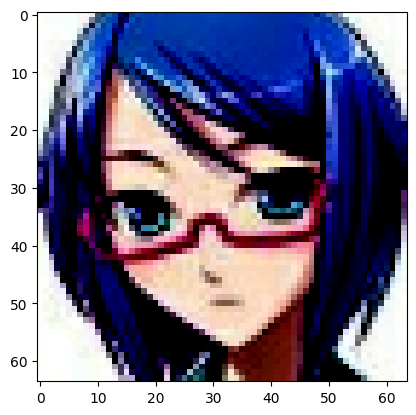

In [8]:
# lets look at the shape of 1 image to confirm what kind of data we are working with
for batch in train_dataset:
    plt.imshow(batch[0])
    print('Image_shape', batch[0].shape)
    break

# Here we able to see that single image is 64 x 64 pixels and 3 channels

Both the generator and discriminator are defined using the Keras Sequential API.

The generator uses tf.keras.layers.Conv2DTranspose (upsampling) layers to produce an image from a seed (random noise). Start with a Dense layer that takes this seed as input, then upsample several times until you reach the desired image size of 64X64x3. Notice the tf.keras.layers.ReLU activation for each layer, except the output layer which uses tanh.
All the convolution-layer weights are initialized from a zero-centered normal distribution, with a standard deviation of 0.02 as per the original paper.
Blocks 2, 3, and 4 consist of a convolution layer, followed by a batch-normalization layer and an activation function, ReLU.
The last block comprises no batch-normalization layer, with a sigmoid activation function.

Note that activation in final layer is tanh which outputs in the range -1 to 1. we reshape the 4*4*256-d tensor to (Batch Size, 4, 4, 256) using layers.Reshape function.Code for GAN architecture is based on this link https://www.kaggle.com/mrigendraagrawal/introduction-to-ganime/notebook and the original paper link on  which architecture is based is here-https://arxiv.org/pdf/1511.06434.pdf

In [9]:
'''
- Here we are going to use the random normal kernel in order to initialize the weights of the
  layers of the model
- This is a Gaussian kernel with the mean of zero and a standard deviaton of 0.02
- we are working with more complex data, So our Neural Network architecture is also little more complex
- initializing the layers of the model can help with model convergence during training
'''


init_weights_kernel = tf.keras.initializers.RandomNormal(mean = 0.0, stddev = 0.02)

In [10]:
def generator_model():
    # The generator in our Deep convolutional GAN is a sequential model
    # That is the output of the one layer is connected to the input of the next layer in sequence
    model = tf.keras.Sequential()

    # Here we have input to the generator, this is a latent noise vector with a dimensionality of 100,
    model.add(layers.Input(shape = (100, )))
    # we have a dense layer with 4 x 4 x 256 neurons - this increases the dimensionality of our input noise
    # so we can project and reshape this into a 4 dimensional tensor -- this is the start of convolutional stack
    model.add(layers.Dense(4 * 4 * 256))
    # the output of the dense layer then fed into batch normalization layer which centers the data
    # so that it have a mean of 0 and variance of one
    model.add(layers.BatchNormalization())
    # thats then passed into ReLU activation layer
    model.add(layers.ReLU())
    # then the data is reshaped, So the original 2 dimensions of batch into input shape is now reshaped
    # to be a four dimensional tensor
    # Batch size is the 1st dimension, the remaining dimensions are 4 x 4 x 256
    model.add(layers.Reshape((4, 4, 256)))

    # then we have number of transpose convolutional layers to upsample the input
    # so here we can see 3 different transpose convolutional layers followed by batch normalization and ReLU activation
    # Each transpose convolutional layer is initialized using our gaussian kernel
    model.add(layers.Conv2DTranspose(128, kernel_size = 4, padding = 'same', strides = 2,
                                     kernel_initializer = init_weights_kernel , use_bias = False))
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())

    model.add(layers.Conv2DTranspose(64, kernel_size = 4, padding = 'same', strides = 2,
                                     kernel_initializer = init_weights_kernel, use_bias = False))
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())

    model.add(layers.Conv2DTranspose(32, kernel_size = 4, padding = 'same', strides = 2,
                                     kernel_initializer = init_weights_kernel, use_bias = False))
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())

    # The final transpose convolutional layer will produce an upsampled image from the generator which is of the
    # same dimensonality as the input from the real dataset, our training dataset
    # So, every image will be 64 x 64 pixels and will be multichannel or 3 channel image
    # this last layer also have the tanh activation, So that the pixel values are in the range -1 to 1
    # which is what we want
    # we can see that the basic structure of this Deep Convolutional GAN is same as Deep Convolutional GAN
    # that we worked earlier, but its more complex with more layers
    model.add(layers.Conv2DTranspose(3, kernel_size = 4, padding = 'same', strides = 2, activation = 'tanh',
                                     kernel_initializer = init_weights_kernel, use_bias = False))


    return model

Building the generator model and summary is obtained

In [11]:
# Setup the generator and look the summary
generator = generator_model()

generator.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 4096)              413696    
                                                                 
 batch_normalization (Batch  (None, 4096)              16384     
 Normalization)                                                  
                                                                 
 re_lu (ReLU)                (None, 4096)              0         
                                                                 
 reshape (Reshape)           (None, 4, 4, 256)         0         
                                                                 
 conv2d_transpose (Conv2DTr  (None, 8, 8, 128)         524288    
 anspose)                                                        
                                                                 
 batch_normalization_1 (Bat  (None, 8, 8, 128)         5

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Using the (as yet untrained) generator to create an random colored image.

In [12]:
# Lets take a look at generated image from the generator model
noise = tf.random.normal([1, 100])

generated_image = generator(noise, training = False)

generated_image.shape

TensorShape([1, 64, 64, 3])

In [13]:
generated_image[0, :5, :5]

<tf.Tensor: shape=(5, 5, 3), dtype=float32, numpy=
array([[[-6.61228041e-05,  9.20007151e-05,  2.84281159e-05],
        [ 1.86202858e-04,  9.62496506e-06,  7.11951143e-05],
        [ 1.93656728e-04,  2.72361969e-04, -2.36751672e-04],
        [ 1.53920380e-04, -3.71542934e-04,  2.39510118e-04],
        [ 4.60235060e-05,  4.42298799e-04, -2.48777680e-04]],

       [[ 9.03059845e-05, -3.44442873e-04,  1.35346709e-04],
        [-4.36107308e-04,  4.80851158e-04,  2.06891797e-04],
        [-5.47801610e-04, -6.60844846e-04, -3.76524782e-04],
        [-4.35314549e-04, -1.57633913e-05, -4.37455717e-04],
        [-4.43063473e-04, -1.06085744e-03,  5.25012147e-04]],

       [[-7.21282340e-05,  1.64833618e-05, -1.91638770e-04],
        [ 1.20236457e-03, -4.88552498e-04,  7.14250840e-04],
        [-1.90134568e-04, -1.74716581e-04, -5.64384100e-04],
        [ 1.81177398e-04, -1.21043622e-03, -3.58199148e-04],
        [-9.62179911e-05,  3.57933925e-04, -2.00581911e-04]],

       [[-3.64748266e-04,  1

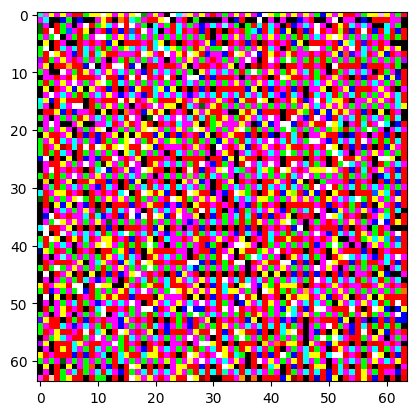

In [14]:
plt.imshow((generated_image[0, :, :, :] * 255 * 100))
# here we see the image which generated with training so it generated a noise
# we also observe that it is a color image or multi-channel image
# It is 64 x 64 pixels

The discriminator is a CNN-based image classifier.

Inputs an image of dimension  64 x 64 x 3

Outputs a score between 0 and 1(sigmoid activation in final layer)
Batch normalisation layer is applied for intermediate layers
All the convolution-layer weights are initialized from a zero-centered normal distribution, with a standard deviation of 0.02 as per the original paper.
Has Leaky-Relu (with a slope of 0.2) as an activation function in the intermediate layers along with dropout layers

Has a Sigmoid activation function in the output layer.Note that we can also leave the last layer without sigmoid activation and use_logits=True in Binary Cross entropy function(which is recommended but we have done it this way  for ease in calculating real and fake scores with their display).

https://www.tensorflow.org/api_docs/python/tf/keras/layers/ZeroPadding2D

If tuple of 2 tuples of 2 ints: interpreted as ((top_pad, bottom_pad), (left_pad, right_pad))

In [15]:
# Let's look at the architecture of discriminator model

def discriminator_model():
    # The discriminator network is also a sequential model and it's made up of convolutional layers
    # followed by LeakyReLU and Dropout layers
    # The discriminator will operate on images from the real and fake dataset
    model = tf.keras.Sequential()

    # Every image is of the shape of 64 x 64 x 3 pixels
    # The authors of original DCGAN's found that LeakyReLU activation worked well with discriminator
    model.add(layers.Conv2D(32, kernel_size = 3, strides = 2, input_shape = (64, 64, 3), padding = 'same',
                            kernel_initializer = init_weights_kernel, use_bias = False ))
    model.add(layers.LeakyReLU(alpha = 0.2))
    model.add(layers.Dropout(0.3))

    # Every batch of the discriminator contains a convolutional layer, batch normalization, LeakyReLU and
    # Dropout layer
    # This particular block of layer contains an additional bit of zero padding
    model.add(layers.Conv2D(64, kernel_size = 3, strides = 2, padding = 'same',
                            kernel_initializer = init_weights_kernel, use_bias = False))
    model.add(layers.ZeroPadding2D(padding = ((0, 1), (0, 1))))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha = 0.2))
    model.add(layers.Dropout(0.25))

    # We can look at these different block of discriminator layer they follow the same structure
    # as the discriminator like previous one
    model.add(layers.Conv2D(128, kernel_size = 3, strides = 2, padding = 'same',
                            kernel_initializer = init_weights_kernel, use_bias = False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha = 0.2))
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(256, kernel_size = 3, strides=1, padding = 'same',
                            kernel_initializer = init_weights_kernel, use_bias = False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha = 0.2))
    model.add(layers.Dropout(0.3))

    # Here is our final layer where we flatten the out of the discriminator and output a
    # single probability
    model.add(layers.Flatten())
    # This is a final output of the discriminator classification model which outputs the probability
    # of whether an input image is real
    # The sigmoid activation ensures that the probability output is in the range of 0 to 1
    model.add(layers.Dense(1, activation = 'sigmoid'))

    return model

Building the discriminator model and summary is obtained

In [16]:
# Lets intantiate the model and see the summary
discriminator = discriminator_model()

discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 32, 32, 32)        864       
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 32, 32, 32)        0         
                                                                 
 dropout (Dropout)           (None, 32, 32, 32)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 16, 16, 64)        18432     
                                                                 
 zero_padding2d (ZeroPaddin  (None, 17, 17, 64)        0         
 g2D)                                                            
                                                                 
 batch_normalization_4 (Bat  (None, 17, 17, 64)        256       
 chNormalization)                                     

Here We are using  the (as yet untrained) discriminator to classify the generated images as real or fake. The model will be trained to output values > 0.5  for real images, and values <0.5 for fake images.

In [17]:
# Let's test with generated image
output = discriminator(generated_image)
print (output)

# Since we haven't trained the discriminator it fails to classify

tf.Tensor([[0.5000007]], shape=(1, 1), dtype=float32)


Now We are defining loss functions. In this case it is Binary Cross entropy as target is real or fake images

In [18]:
# Here again we are using the same Binary cross entropy loss
bce = tf.keras.losses.BinaryCrossentropy()

This method quantifies how well the discriminator is able to distinguish real images from fakes. It compares the discriminator's predictions on real images to an array of 1s, and the discriminator's predictions on fake (generated) images to an array of 0s.

In [19]:
# We use the function to set up the loss for the discriminator
def discriminator_loss(real_output, fake_output):
    real_loss = bce(tf.ones_like(real_output), real_output)
    fake_loss = bce(tf.zeros_like(fake_output), fake_output)

    total_loss = real_loss + fake_loss

    return total_loss

The generator's loss quantifies how well it was able to trick the discriminator. Intuitively, if the generator is performing well, the discriminator will classify the fake images as real (or 1). Here, compare the discriminators decisions on the generated images to an array of 1s.

In [20]:
# The next function is the loss for the Generator
def generator_loss(fake_output):
    gen_loss = bce(tf.ones_like(fake_output), fake_output)

    return gen_loss

The discriminator and the generator optimizers are different since  two networks would be trained separately.Note that parameters are set as per 2016 paper- https://arxiv.org/pdf/1511.06434.pdf

In [21]:
# Set up the optimizer for both of the neural networks
generator_optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0002, beta_1 = 0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0002, beta_1 = 0.5)

Following code demonstrates how to save and restore models, which can be helpful in case a long running training task is interrupted.

In [22]:
# Creating the checkpoint directory
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, 'ckpt')
checkpoint = tf.train.Checkpoint(generator_optimizer = generator_optimizer,
                                 discriminator_optimizer = discriminator_optimizer,
                                 generator = generator,
                                 discriminator = discriminator)

The training loop begins with generator receiving a random seed as input. That seed is used to produce an image. The discriminator is then used to classify real images (drawn from the training set) and fakes images (produced by the generator). The loss is calculated for each of these models, and the gradients are used to update the generator and discriminator.

We are using `tf.function`
This annotation causes the function to be "compiled".


In [23]:
# Here we define the epochs and input dimensions etc..
epochs = 50
noise_dim = 100
num_examples_to_generate = 16

seed = tf.random.normal([num_examples_to_generate, noise_dim])

Notice `training` is set to False.
This is so all layers run in inference mode (batchnorm).
Function for generating and saving images is defined

In [24]:
# Here we have the utility function that will generate and plot images during training process
def generate_and_plot_images(model, epoch, test_input):

    predictions = model(test_input, training = False)

    fig = plt.figure(figsize = (8, 4))

    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i + 1)
        plt.imshow((predictions[i, :, :, :] * 0.5 + 0.5))
        plt.axis('off')

    plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
    plt.show()

In [25]:
# Here the train_step function that we use to train our model on a single batch of images

@tf.function
def train_step(images):
    noise = tf.random.normal([batch_size, noise_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training = True)

        real_output = discriminator(images, training = True)
        fake_output = discriminator(generated_images, training = True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return (gen_loss, disc_loss, tf.reduce_mean(real_output), tf.reduce_mean(fake_output))

In [26]:
# Here we have the train function
# For each batch of training it will invoke the train_step function
def train(dataset, epochs):

    gen_loss_list = []
    disc_loss_list = []

    real_score_list = []
    fake_score_list = []

    for epoch in tqdm(range(epochs)):
        start = time.time()
        num_batches = len(dataset)

        print(f'Training started with  epoch {epoch + 1} with {num_batches} batches..')

        total_gen_loss = 0
        total_disc_loss = 0

        for batch in dataset:
            generator_loss, discriminator_loss, real_score, fake_score = train_step(batch)

            total_gen_loss += generator_loss
            total_disc_loss += discriminator_loss

        mean_gen_loss = total_gen_loss / num_batches
        mean_disc_loss = total_disc_loss / num_batches

        print('Losses after epoch %5d: generator %.3f, discriminator %.3f,\
               real_score %.2f%%, fake_score %.2f%%'  %
              (epoch+1, generator_loss, discriminator_loss, real_score * 100, fake_score * 100))

        generate_and_plot_images(generator, epoch + 1, seed)

        gen_loss_list.append(mean_gen_loss)
        disc_loss_list.append(mean_disc_loss)
        real_score_list.append(real_score)
        fake_score_list.append(fake_score)

        if (epoch + 1) % 10 == 0:
              checkpoint.save(file_prefix = checkpoint_prefix)

        print ('Time for epoch {} is {} sec'.format(epoch + 1, time.time() - start))


    return  gen_loss_list, disc_loss_list, real_score_list, fake_score_list

Finally, it’s time to train our  GAN model in Tensorflow. Taking the train_dataset and epochs as the parameters, the  train function calls the train_step function, at every new batch.At the beginning of the training, the generated images looks hazy. As training progresses, the generated images will look more real. The Real and Fake scores seems to be volatile

  0%|          | 0/50 [00:00<?, ?it/s]

Training started with  epoch 1 with 497 batches..
Losses after epoch     1: generator 4.558, discriminator 0.058,               real_score 98.80%, fake_score 3.95%


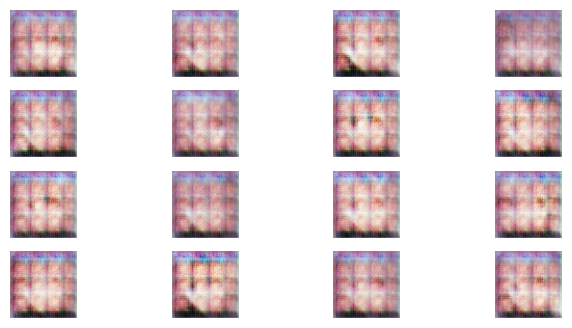

  2%|▏         | 1/50 [01:22<1:07:27, 82.59s/it]

Time for epoch 1 is 82.59133410453796 sec
Training started with  epoch 2 with 497 batches..
Losses after epoch     2: generator 3.585, discriminator 0.378,               real_score 89.64%, fake_score 12.41%


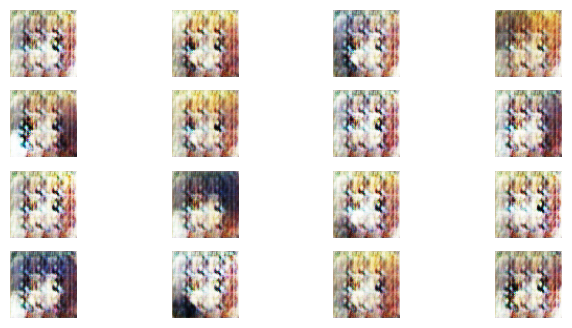

  4%|▍         | 2/50 [01:50<40:26, 50.56s/it]  

Time for epoch 2 is 28.121155500411987 sec
Training started with  epoch 3 with 497 batches..
Losses after epoch     3: generator 5.898, discriminator 0.199,               real_score 87.72%, fake_score 2.02%


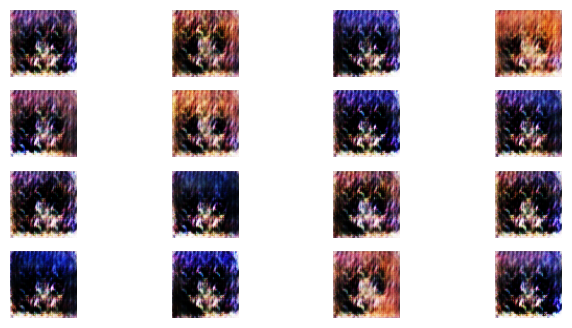

  6%|▌         | 3/50 [02:33<36:42, 46.86s/it]

Time for epoch 3 is 42.45754075050354 sec
Training started with  epoch 4 with 497 batches..
Losses after epoch     4: generator 2.951, discriminator 0.441,               real_score 85.07%, fake_score 12.55%


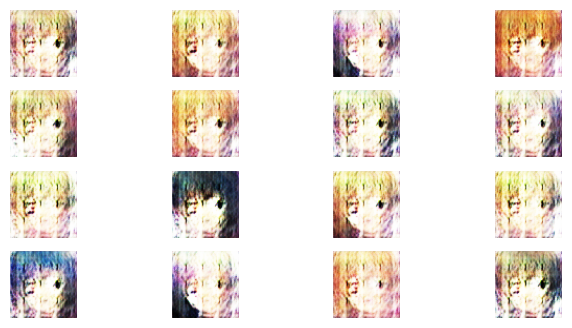

  8%|▊         | 4/50 [03:04<31:08, 40.63s/it]

Time for epoch 4 is 31.063361406326294 sec
Training started with  epoch 5 with 497 batches..
Losses after epoch     5: generator 5.608, discriminator 0.578,               real_score 72.55%, fake_score 3.11%


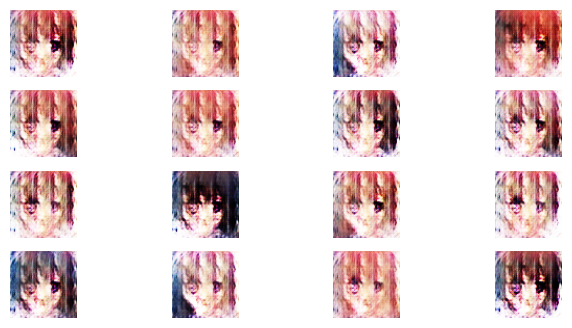

 10%|█         | 5/50 [03:45<30:42, 40.94s/it]

Time for epoch 5 is 41.47917342185974 sec
Training started with  epoch 6 with 497 batches..
Losses after epoch     6: generator 2.500, discriminator 0.455,               real_score 89.05%, fake_score 20.04%


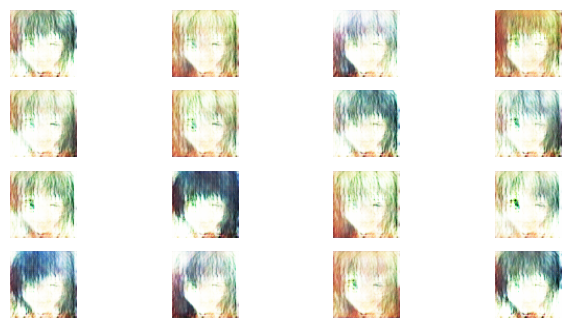

 12%|█▏        | 6/50 [04:14<27:06, 36.96s/it]

Time for epoch 6 is 29.226218700408936 sec
Training started with  epoch 7 with 497 batches..
Losses after epoch     7: generator 2.382, discriminator 0.434,               real_score 92.49%, fake_score 21.30%


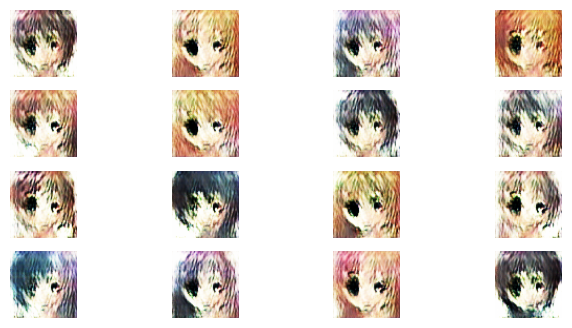

 14%|█▍        | 7/50 [04:43<24:37, 34.36s/it]

Time for epoch 7 is 29.01364779472351 sec
Training started with  epoch 8 with 497 batches..
Losses after epoch     8: generator 5.345, discriminator 0.564,               real_score 68.77%, fake_score 2.01%


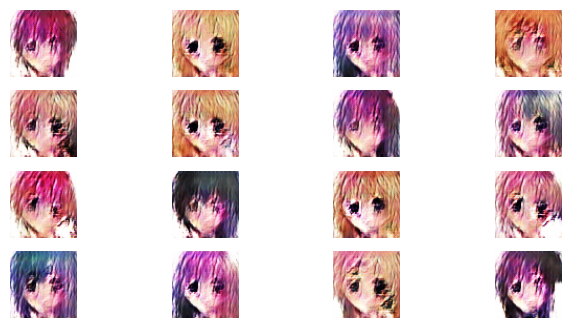

 16%|█▌        | 8/50 [05:26<25:46, 36.83s/it]

Time for epoch 8 is 42.095842599868774 sec
Training started with  epoch 9 with 497 batches..
Losses after epoch     9: generator 5.593, discriminator 0.308,               real_score 81.13%, fake_score 1.82%


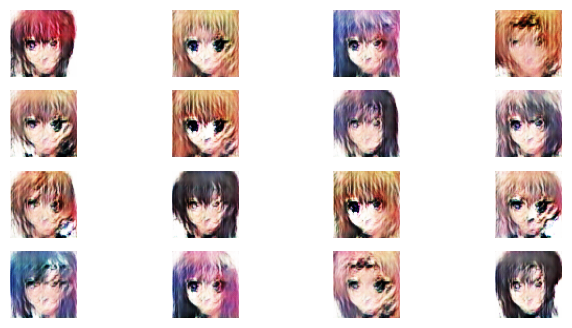

 18%|█▊        | 9/50 [05:54<23:22, 34.21s/it]

Time for epoch 9 is 28.46518111228943 sec
Training started with  epoch 10 with 497 batches..
Losses after epoch    10: generator 2.348, discriminator 0.499,               real_score 90.02%, fake_score 21.71%


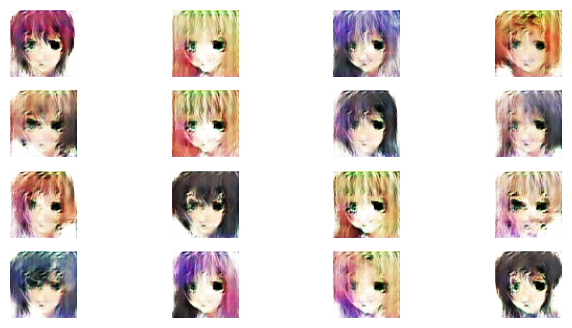

 20%|██        | 10/50 [06:36<24:20, 36.52s/it]

Time for epoch 10 is 41.68237257003784 sec
Training started with  epoch 11 with 497 batches..
Losses after epoch    11: generator 2.974, discriminator 0.469,               real_score 79.27%, fake_score 12.01%


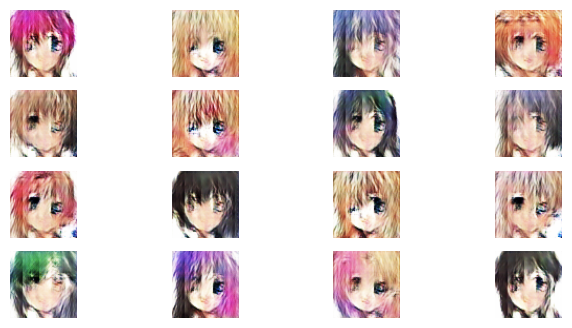

 22%|██▏       | 11/50 [07:05<22:19, 34.35s/it]

Time for epoch 11 is 29.429565906524658 sec
Training started with  epoch 12 with 497 batches..
Losses after epoch    12: generator 2.676, discriminator 0.501,               real_score 81.21%, fake_score 15.62%


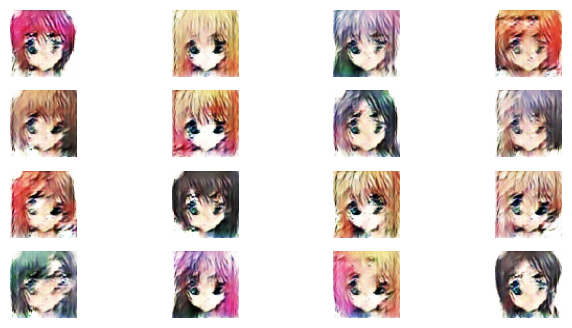

 24%|██▍       | 12/50 [07:35<20:47, 32.84s/it]

Time for epoch 12 is 29.362383127212524 sec
Training started with  epoch 13 with 497 batches..
Losses after epoch    13: generator 1.280, discriminator 0.884,               real_score 94.96%, fake_score 44.08%


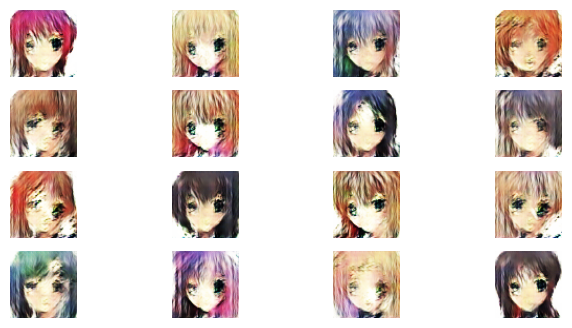

 26%|██▌       | 13/50 [08:03<19:20, 31.37s/it]

Time for epoch 13 is 27.994372129440308 sec
Training started with  epoch 14 with 497 batches..
Losses after epoch    14: generator 3.543, discriminator 0.547,               real_score 78.53%, fake_score 8.75%


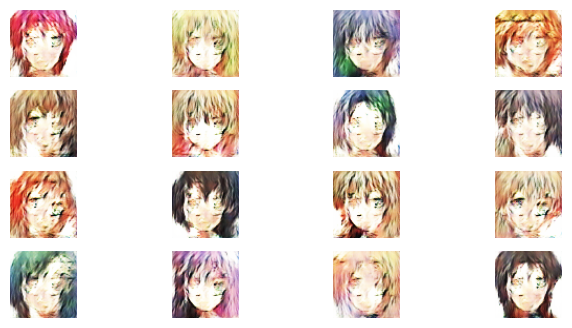

 28%|██▊       | 14/50 [08:30<18:10, 30.29s/it]

Time for epoch 14 is 27.780121088027954 sec
Training started with  epoch 15 with 497 batches..
Losses after epoch    15: generator 0.051, discriminator 4.851,               real_score 99.95%, fake_score 95.54%


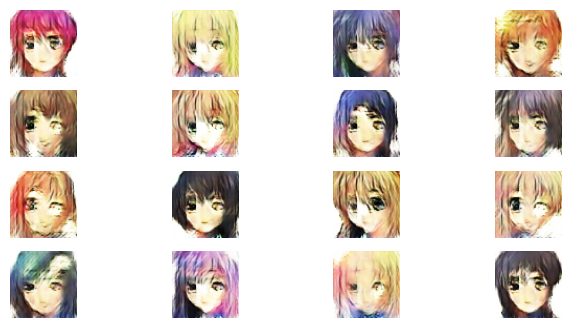

 30%|███       | 15/50 [08:59<17:20, 29.72s/it]

Time for epoch 15 is 28.397872924804688 sec
Training started with  epoch 16 with 497 batches..
Losses after epoch    16: generator 2.868, discriminator 0.318,               real_score 91.26%, fake_score 14.06%


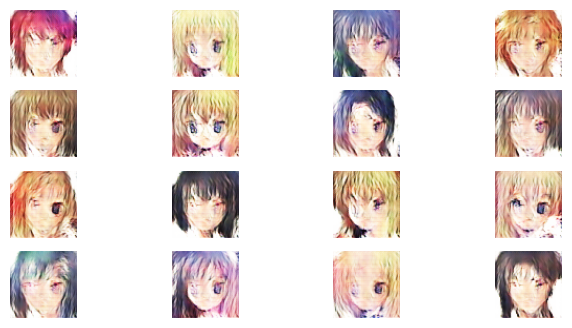

 32%|███▏      | 16/50 [09:27<16:33, 29.22s/it]

Time for epoch 16 is 28.0641827583313 sec
Training started with  epoch 17 with 497 batches..
Losses after epoch    17: generator 3.059, discriminator 0.491,               real_score 78.40%, fake_score 11.63%


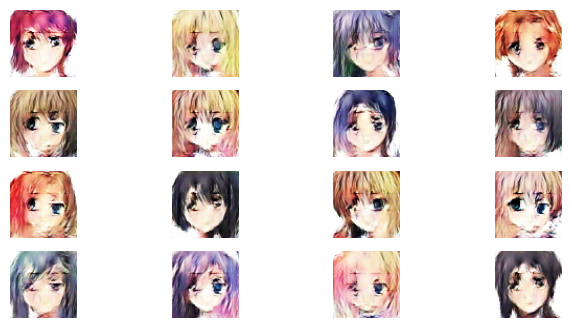

 34%|███▍      | 17/50 [09:55<15:51, 28.84s/it]

Time for epoch 17 is 27.954689979553223 sec
Training started with  epoch 18 with 497 batches..
Losses after epoch    18: generator 6.377, discriminator 1.453,               real_score 41.47%, fake_score 0.70%


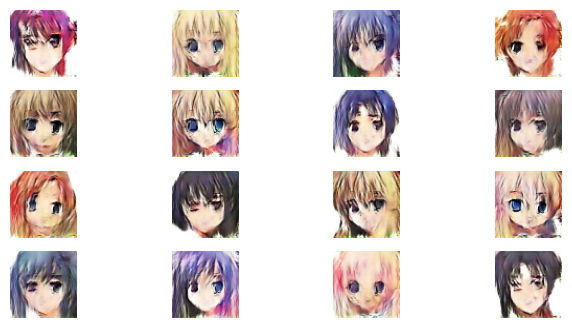

 36%|███▌      | 18/50 [10:23<15:18, 28.70s/it]

Time for epoch 18 is 28.350471019744873 sec
Training started with  epoch 19 with 497 batches..
Losses after epoch    19: generator 1.506, discriminator 0.756,               real_score 91.92%, fake_score 37.70%


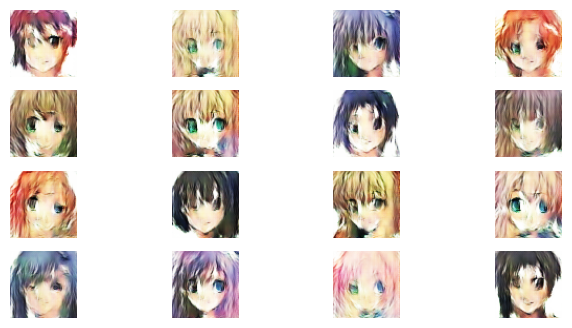

 38%|███▊      | 19/50 [10:51<14:43, 28.49s/it]

Time for epoch 19 is 27.98819923400879 sec
Training started with  epoch 20 with 497 batches..
Losses after epoch    20: generator 4.467, discriminator 0.681,               real_score 65.93%, fake_score 3.21%


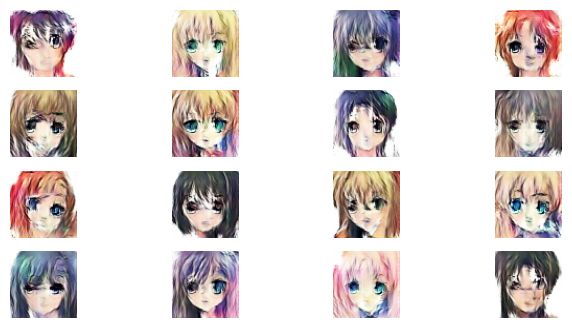

 40%|████      | 20/50 [11:19<14:11, 28.37s/it]

Time for epoch 20 is 28.100074768066406 sec
Training started with  epoch 21 with 497 batches..
Losses after epoch    21: generator 1.780, discriminator 0.611,               real_score 88.39%, fake_score 29.66%


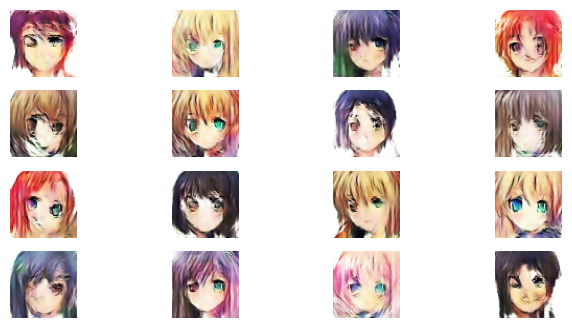

 42%|████▏     | 21/50 [11:47<13:39, 28.27s/it]

Time for epoch 21 is 28.02682089805603 sec
Training started with  epoch 22 with 497 batches..
Losses after epoch    22: generator 5.235, discriminator 1.061,               real_score 45.93%, fake_score 1.50%


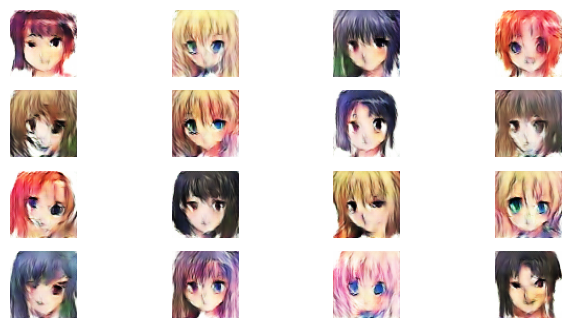

 44%|████▍     | 22/50 [12:15<13:11, 28.25s/it]

Time for epoch 22 is 28.20666480064392 sec
Training started with  epoch 23 with 497 batches..
Losses after epoch    23: generator 4.620, discriminator 1.522,               real_score 34.53%, fake_score 3.35%


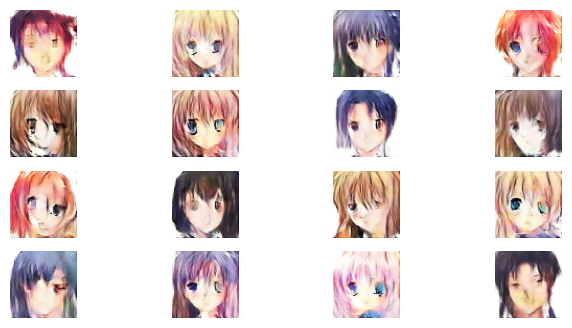

 46%|████▌     | 23/50 [12:44<12:42, 28.23s/it]

Time for epoch 23 is 28.178089141845703 sec
Training started with  epoch 24 with 497 batches..
Losses after epoch    24: generator 3.143, discriminator 0.436,               real_score 85.22%, fake_score 13.66%


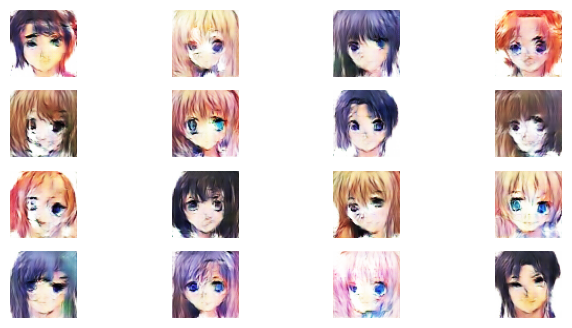

 48%|████▊     | 24/50 [13:12<12:12, 28.16s/it]

Time for epoch 24 is 27.98213291168213 sec
Training started with  epoch 25 with 497 batches..
Losses after epoch    25: generator 1.965, discriminator 0.662,               real_score 79.88%, fake_score 25.72%


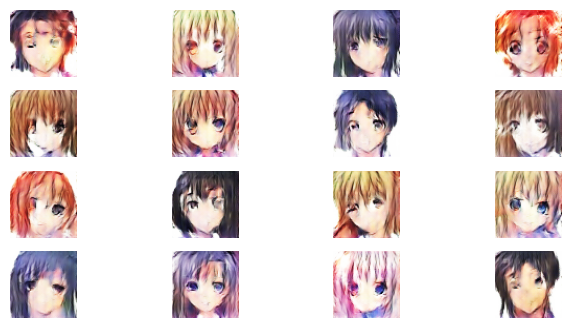

 50%|█████     | 25/50 [13:53<13:24, 32.18s/it]

Time for epoch 25 is 41.56167721748352 sec
Training started with  epoch 26 with 497 batches..
Losses after epoch    26: generator 4.668, discriminator 1.132,               real_score 46.90%, fake_score 3.10%


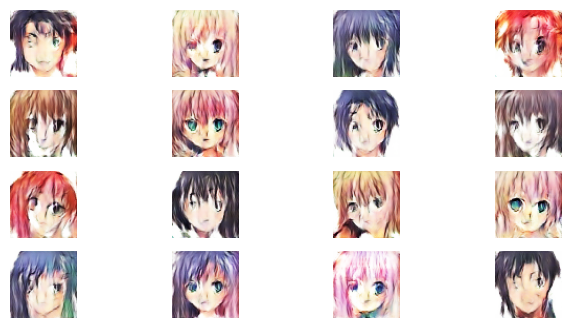

 52%|█████▏    | 26/50 [14:22<12:24, 31.04s/it]

Time for epoch 26 is 28.36367106437683 sec
Training started with  epoch 27 with 497 batches..
Losses after epoch    27: generator 0.208, discriminator 2.880,               real_score 99.58%, fake_score 85.96%


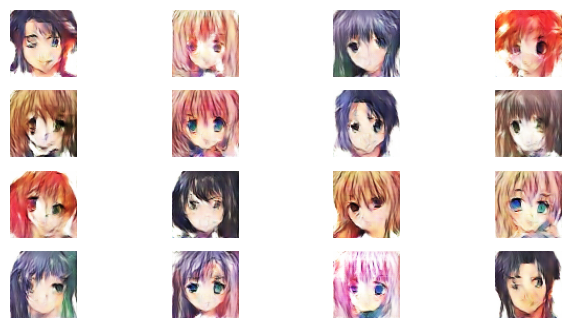

 54%|█████▍    | 27/50 [15:04<13:10, 34.36s/it]

Time for epoch 27 is 42.095881938934326 sec
Training started with  epoch 28 with 497 batches..
Losses after epoch    28: generator 3.000, discriminator 0.356,               real_score 84.98%, fake_score 12.78%


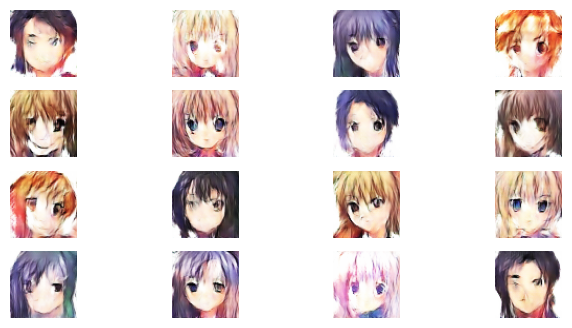

 56%|█████▌    | 28/50 [15:32<11:54, 32.47s/it]

Time for epoch 28 is 28.051790237426758 sec
Training started with  epoch 29 with 497 batches..
Losses after epoch    29: generator 1.945, discriminator 0.383,               real_score 95.17%, fake_score 24.22%


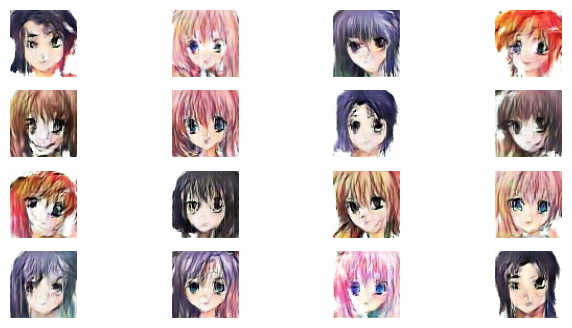

 58%|█████▊    | 29/50 [16:01<10:59, 31.42s/it]

Time for epoch 29 is 28.99180793762207 sec
Training started with  epoch 30 with 497 batches..
Losses after epoch    30: generator 3.114, discriminator 0.609,               real_score 72.93%, fake_score 12.14%


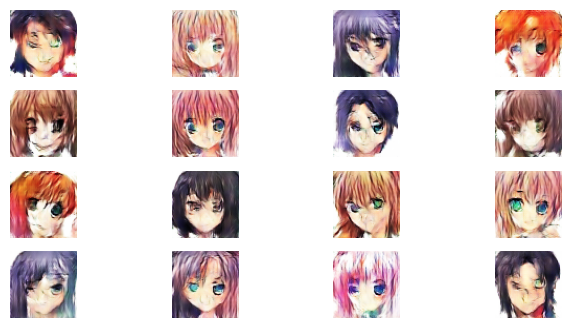

 60%|██████    | 30/50 [16:29<10:06, 30.33s/it]

Time for epoch 30 is 27.775511741638184 sec
Training started with  epoch 31 with 497 batches..
Losses after epoch    31: generator 3.960, discriminator 0.310,               real_score 82.58%, fake_score 5.99%


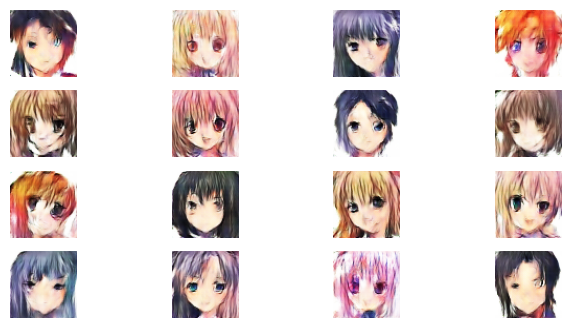

 62%|██████▏   | 31/50 [16:57<09:24, 29.73s/it]

Time for epoch 31 is 28.32203769683838 sec
Training started with  epoch 32 with 497 batches..
Losses after epoch    32: generator 4.471, discriminator 0.568,               real_score 68.77%, fake_score 4.25%


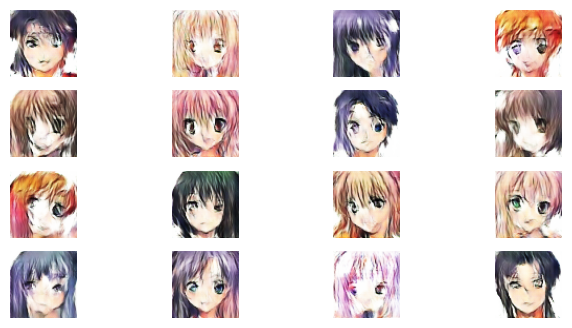

 64%|██████▍   | 32/50 [17:25<08:47, 29.30s/it]

Time for epoch 32 is 28.312472581863403 sec
Training started with  epoch 33 with 497 batches..
Losses after epoch    33: generator 6.289, discriminator 0.875,               real_score 53.38%, fake_score 0.68%


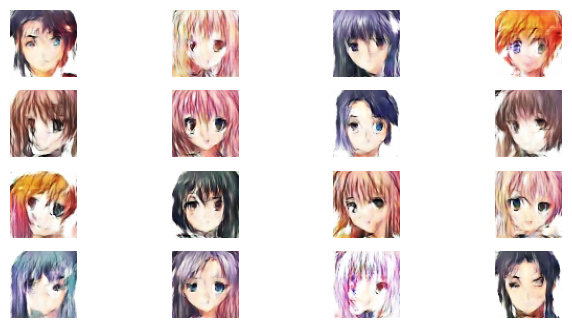

 66%|██████▌   | 33/50 [17:53<08:10, 28.86s/it]

Time for epoch 33 is 27.835652351379395 sec
Training started with  epoch 34 with 497 batches..
Losses after epoch    34: generator 7.427, discriminator 1.998,               real_score 24.52%, fake_score 0.25%


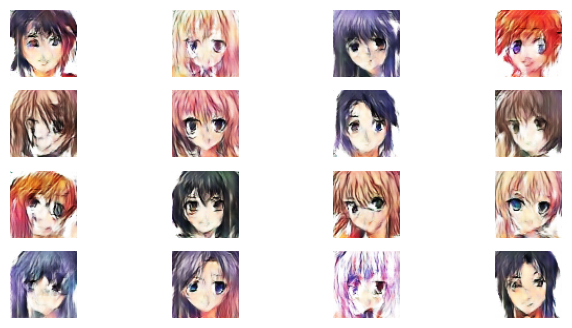

 68%|██████▊   | 34/50 [18:21<07:38, 28.68s/it]

Time for epoch 34 is 28.238905668258667 sec
Training started with  epoch 35 with 497 batches..
Losses after epoch    35: generator 2.564, discriminator 0.664,               real_score 72.76%, fake_score 17.17%


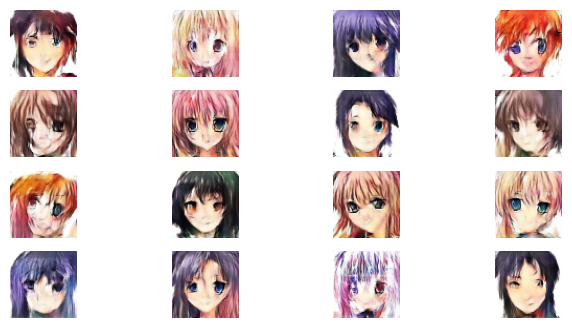

 70%|███████   | 35/50 [18:50<07:08, 28.59s/it]

Time for epoch 35 is 28.396721363067627 sec
Training started with  epoch 36 with 497 batches..
Losses after epoch    36: generator 3.156, discriminator 0.411,               real_score 81.08%, fake_score 11.83%


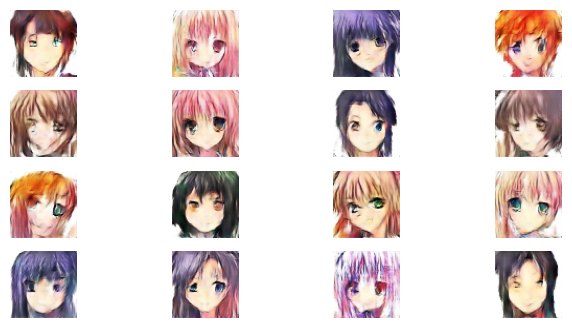

 72%|███████▏  | 36/50 [19:18<06:38, 28.49s/it]

Time for epoch 36 is 28.24590539932251 sec
Training started with  epoch 37 with 497 batches..
Losses after epoch    37: generator 2.656, discriminator 0.420,               real_score 84.75%, fake_score 15.03%


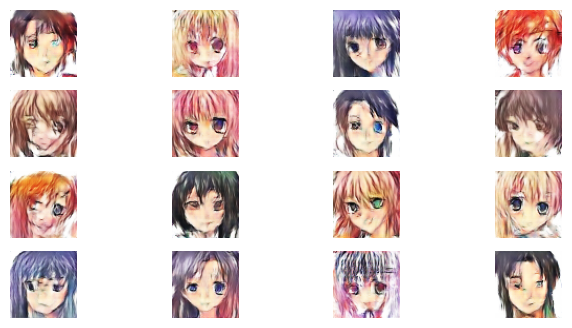

 74%|███████▍  | 37/50 [19:46<06:08, 28.32s/it]

Time for epoch 37 is 27.903393507003784 sec
Training started with  epoch 38 with 497 batches..
Losses after epoch    38: generator 3.220, discriminator 0.172,               real_score 97.67%, fake_score 10.33%


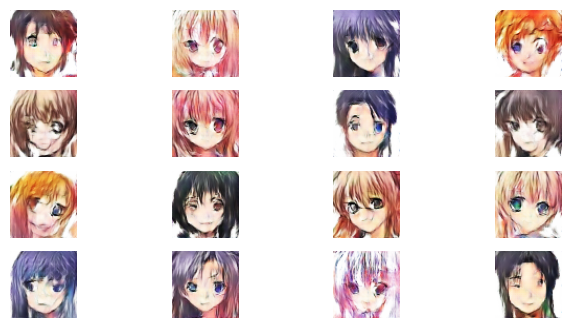

 76%|███████▌  | 38/50 [20:14<05:39, 28.31s/it]

Time for epoch 38 is 28.293097496032715 sec
Training started with  epoch 39 with 497 batches..
Losses after epoch    39: generator 3.659, discriminator 0.534,               real_score 71.48%, fake_score 7.62%


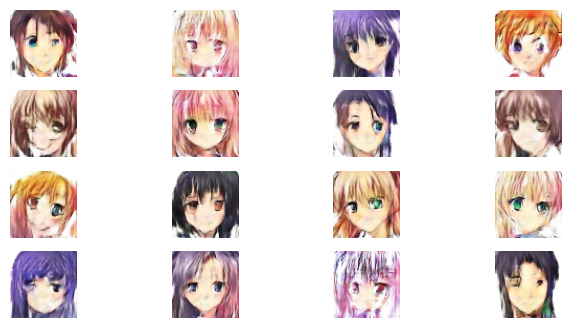

 78%|███████▊  | 39/50 [20:42<05:10, 28.23s/it]

Time for epoch 39 is 28.049793481826782 sec
Training started with  epoch 40 with 497 batches..
Losses after epoch    40: generator 3.929, discriminator 0.305,               real_score 82.08%, fake_score 5.50%


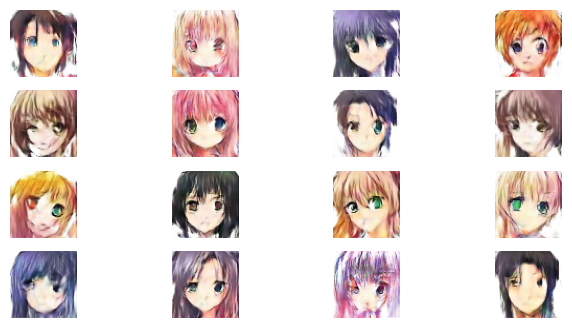

 80%|████████  | 40/50 [21:10<04:42, 28.22s/it]

Time for epoch 40 is 28.175193071365356 sec
Training started with  epoch 41 with 497 batches..
Losses after epoch    41: generator 4.598, discriminator 1.163,               real_score 47.79%, fake_score 3.20%


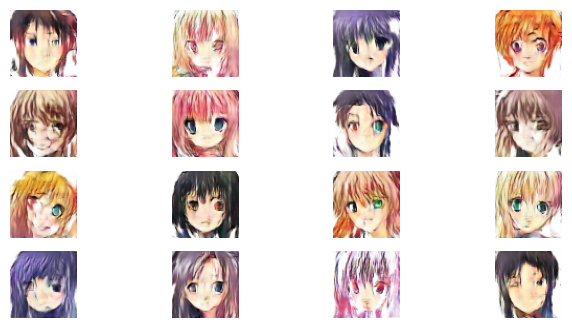

 82%|████████▏ | 41/50 [21:38<04:13, 28.19s/it]

Time for epoch 41 is 28.131080627441406 sec
Training started with  epoch 42 with 497 batches..
Losses after epoch    42: generator 3.141, discriminator 0.219,               real_score 93.02%, fake_score 10.23%


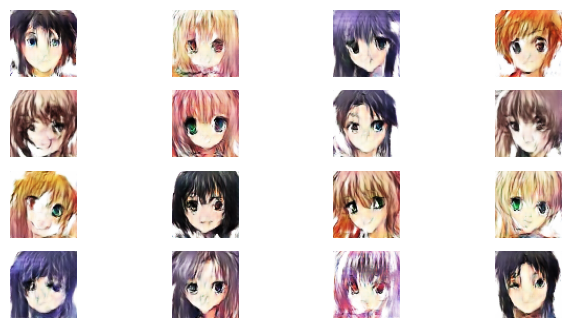

 84%|████████▍ | 42/50 [22:07<03:45, 28.18s/it]

Time for epoch 42 is 28.150878190994263 sec
Training started with  epoch 43 with 497 batches..
Losses after epoch    43: generator 3.443, discriminator 0.249,               real_score 89.64%, fake_score 8.80%


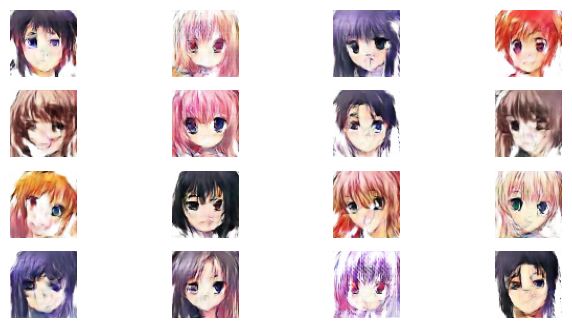

 86%|████████▌ | 43/50 [22:35<03:16, 28.11s/it]

Time for epoch 43 is 27.94291639328003 sec
Training started with  epoch 44 with 497 batches..
Losses after epoch    44: generator 1.831, discriminator 0.624,               real_score 83.82%, fake_score 27.21%


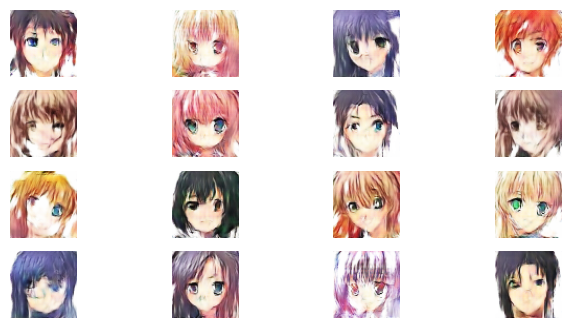

 88%|████████▊ | 44/50 [23:03<02:48, 28.07s/it]

Time for epoch 44 is 27.955814599990845 sec
Training started with  epoch 45 with 497 batches..
Losses after epoch    45: generator 0.764, discriminator 1.325,               real_score 98.93%, fake_score 58.74%


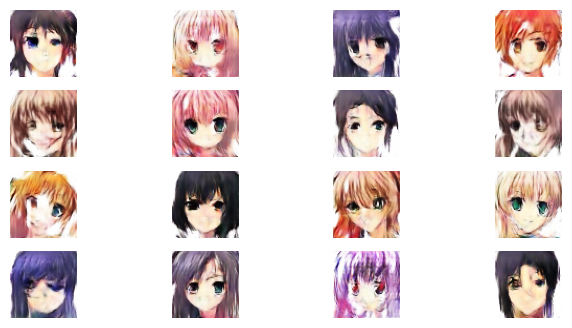

 90%|█████████ | 45/50 [23:31<02:20, 28.11s/it]

Time for epoch 45 is 28.21157145500183 sec
Training started with  epoch 46 with 497 batches..
Losses after epoch    46: generator 2.838, discriminator 0.256,               real_score 93.53%, fake_score 13.58%


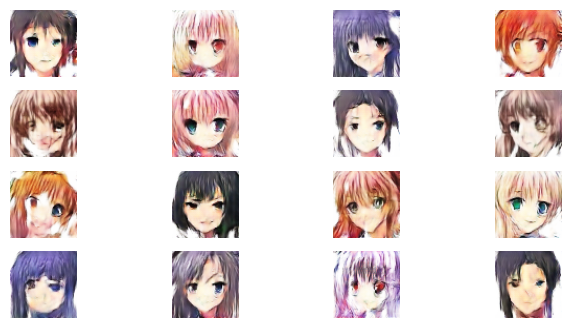

 92%|█████████▏| 46/50 [23:59<01:52, 28.12s/it]

Time for epoch 46 is 28.12804341316223 sec
Training started with  epoch 47 with 497 batches..
Losses after epoch    47: generator 3.549, discriminator 0.200,               real_score 91.62%, fake_score 8.30%


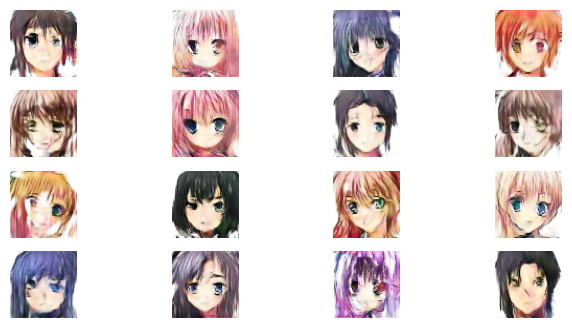

 94%|█████████▍| 47/50 [24:27<01:24, 28.09s/it]

Time for epoch 47 is 28.037908792495728 sec
Training started with  epoch 48 with 497 batches..
Losses after epoch    48: generator 3.290, discriminator 0.174,               real_score 97.56%, fake_score 11.11%


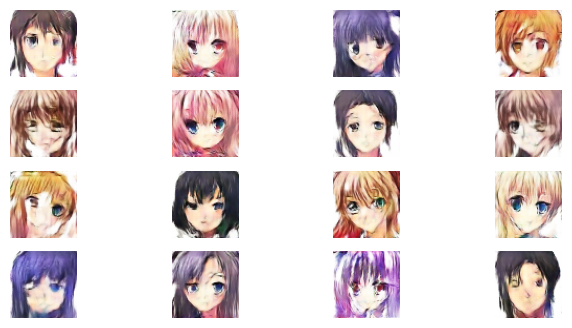

 96%|█████████▌| 48/50 [24:55<00:56, 28.04s/it]

Time for epoch 48 is 27.920674324035645 sec
Training started with  epoch 49 with 497 batches..
Losses after epoch    49: generator 4.061, discriminator 0.154,               real_score 92.25%, fake_score 5.46%


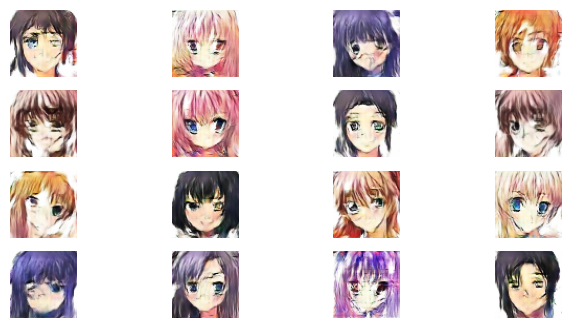

 98%|█████████▊| 49/50 [25:23<00:28, 28.12s/it]

Time for epoch 49 is 28.309542179107666 sec
Training started with  epoch 50 with 497 batches..
Losses after epoch    50: generator 3.945, discriminator 0.155,               real_score 93.04%, fake_score 6.05%


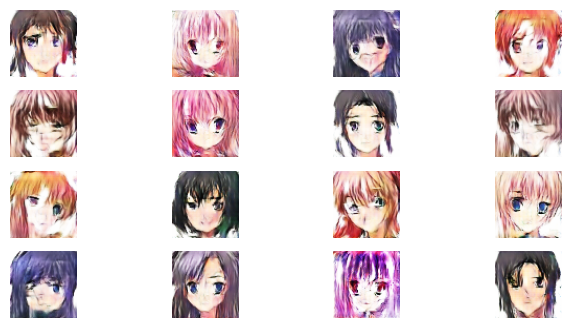

100%|██████████| 50/50 [25:52<00:00, 31.05s/it]

Time for epoch 50 is 28.870770931243896 sec


In [27]:
# since our dataset is more complex and our neural network architecture is more complex training will run for longer
# on the GPU
# It may take up to 15 minutes

gen_loss_epochs, disc_loss_epochs, real_score_list, fake_score_list = train(train_dataset, epochs = epochs)

# even after just one epoch of training we can see the outlines of the faces that have been generated by Generator
# at end of epoch we see this worked really well

Plotting visualisations for Losses and Scores

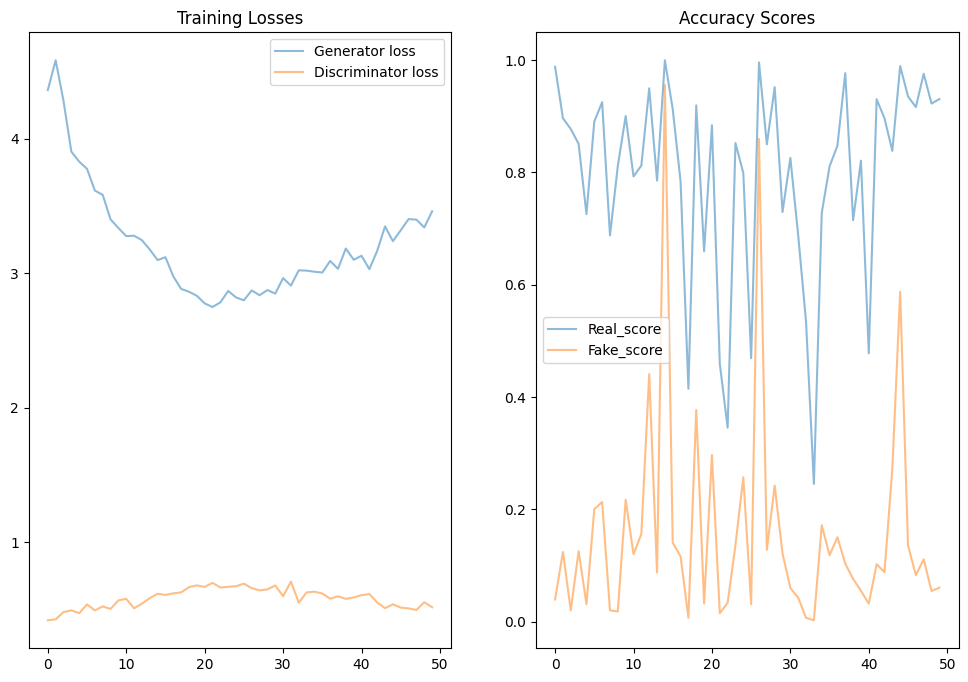

In [28]:
fig, (ax1,ax2) = plt.subplots(1, 2, figsize = (12, 8))

ax1.plot(gen_loss_epochs, label = 'Generator loss', alpha = 0.5)
ax1.plot(disc_loss_epochs, label = 'Discriminator loss', alpha = 0.5)
ax1.legend()
ax1.set_title('Training Losses')

ax2.plot(real_score_list, label = 'Real_score', alpha = 0.5)
ax2.plot(fake_score_list, label = 'Fake_score', alpha = 0.5)
ax2.set_title('Accuracy Scores')

ax2.legend()

## Here we able to see the trend which we saw earlier
## Generator loss falls steadily
## Discriminator loss increases

## accuracy scores of the discriminator likely to converge at around 0.5
## At end of the training the discriminator not able to differentiate between the real and fake images